# Home Credit Prediction: EDA of Current Application Table


For an up-to-date version / full view of the plotly - plots, please, go to

EDA - Current Application:  https://drive.google.com/file/d/16SfMGU5vTY2-fQyreZdBZolH9ZKO-xq-/view?usp=sharing

List of all notebooks and resources for this project: https://drive.google.com/file/d/1Z8vPNZAcivWOxeh3UKFfeARbQCMkQ_NR/view?usp=sharing

## Import Modules

In [1]:
%%capture
#! pip install -q kaggle
! pip install -q pingouin
! pip install -q scikit-optimize

In [2]:
import numpy as np
import pandas as pd

import sys
import os
import warnings
from importlib import reload

from dask import dataframe as dd
#import matplotlib.pyplot as plt
#import seaborn as sns
#import plotly.express as px
#
#from statsmodels.stats.proportion import proportions_ztest
import pingouin as pg



from google.colab import drive
drive.mount("/content/gdrive")

warnings.filterwarnings('ignore')

pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_columns', None)
#pd.reset_option('display.max_rows')

/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


Mounted at /content/gdrive


In [3]:
home_folder = '/content/gdrive/MyDrive/Colab Notebooks/Portfolio/ML_HomeCredit_DefaultRiskEvaluation/'

### Functions

The Python-file with the functions is at
https://drive.google.com/file/d/17IchsTGy2QI9sq0LTIvGvxAk2mrWs4Xz/view?usp=sharing

In [4]:
%load_ext autoreload
%autoreload 2

sys.path.append(home_folder)
import driskfunc as dfunc

# 1. Load and Update Data

data source: https://storage.googleapis.com/341-home-credit-default/home-credit-default-risk.zip

description: https://storage.googleapis.com/341-home-credit-default/Home%20Credit%20Default%20Risk.pdf

In [5]:
HCdescr = pd.read_csv(home_folder+'data/HomeCredit_columns_description.csv', encoding='latin1') #, dtype=dtype)


In [6]:
HCdescr.loc[HCdescr.Table == 'application_{train|test}.csv']

,Unnamed: 0,Table,Row,Description,Special
0,1,application_{train|test}.csv,SK_ID_CURR,ID of loan in our sample,NaN
1,2,application_{train|test}.csv,TARGET,"Target variable (1 - client with payment difficulties: he/she had late payment more than X days on at least one of the first Y installments of the loan in our sample, 0 - all other cases)",NaN
2,5,application_{train|test}.csv,NAME_CONTRACT_TYPE,Identification if loan is cash or revolving,NaN
3,6,application_{train|test}.csv,CODE_GENDER,Gender of the client,NaN
4,7,application_{train|test}.csv,FLAG_OWN_CAR,Flag if the client owns a car,NaN
5,8,application_{train|test}.csv,FLAG_OWN_REALTY,Flag if client owns a house or flat,NaN
6,9,application_{train|test}.csv,CNT_CHILDREN,Number of children the client has,NaN
7,10,application_{train|test}.csv,AMT_INCOME_TOTAL,Income of the client,NaN
8,11,application_{train|test}.csv,AMT_CREDIT,Credit amount of the loan,NaN
9,12,application_{train|test}.csv,AMT_ANNUITY,Loan annuity,NaN


In [7]:
#csv_app_train = home_folder+'data/application_train.csv'
#csv_app_test = home_folder+'data/application_test.csv'
#
#HCapp_train_dd = dd.read_csv(csv_app_train) #, dtype=dtype)
#HCapp_test_dd = dd.read_csv(csv_app_test) #, dtype=dtype)

In [8]:
%%capture
#! mkdir home_folder+'cleaned/'
df_final = dd.read_csv(home_folder+'cleaned/HC_app_train_combined.csv')

# EDA

EDA:
- Statistical Overview
- Distributions of Parameters
- Correlation of features
- Scatterplots of numerical features against each other
- Hypothesis Tests to assess the significance of the features


EDA-obectives:?

What do we know about the borrower from which we can predict whether he/she will be able to pay the loan?

* possible predictors for payment issue loans based on
  * features on borrower's current situation
  * features on borrower's credit and payment behaviour prior to loan application


---> discard all parameters related a running payments of the loan and status.


## Group Features

In [9]:
app_size = len(df_final)

In [59]:
#df_final['TARGET'].value_counts().compute()

,count
TARGET,
0,282686
1,24825


In [60]:
#df_target = df_final  #HCapp_train_dd.compute()

df_mod = df_final['TARGET'].astype('str')
df_mod = df_mod.mask((df_mod=='1'), 'Payment Issues')
df_mod = df_mod.mask((df_mod=='0'), 'No Payment Issues')
df_final['TARGET_mod'] = df_mod

num_feat = df_final.select_dtypes(include=np.number).columns.tolist()
cat_feat = df_final.select_dtypes(exclude=np.number).columns.tolist()

In [62]:
#df_final['TARGET_mod'].value_counts().compute()

In [63]:
SAMPLES = 10000
frac = SAMPLES/app_size
df_final_sampled = df_final.sample(frac=frac, replace=False,
                                                   random_state=10)

df_target = df_final_sampled.compute()


In [64]:
other_tables = [ 'AMT_ANNUITY_prev',
 'AMT_APPLICATION',
 'AMT_CREDIT_prev',
 'AMT_DOWN_PAYMENT',
 'AMT_GOODS_PRICE_prev',
 'HOUR_APPR_PROCESS_START_prev',
 'FLAG_LAST_APPL_PER_CONTRACT',
 'NFLAG_LAST_APPL_IN_DAY',
 'RATE_DOWN_PAYMENT',
 'RATE_INTEREST_PRIMARY',
 'RATE_INTEREST_PRIVILEGED',
 'DAYS_DECISION',
 'SELLERPLACE_AREA',
 'CNT_PAYMENT',
 'DAYS_FIRST_DRAWING',
 'DAYS_FIRST_DUE',
 'DAYS_LAST_DUE_1ST_VERSION',
 'DAYS_LAST_DUE',
 'DAYS_TERMINATION',
 'NFLAG_INSURED_ON_APPROVAL',
 'WEEKDAY_APPR_PROCESS_START_ordinal',
 'AMT_ANNUITY_plain',
 'AMT_ANNUITY_diff',
 'int_rate_plain',
 'int_rate_plain_diff',
 'AMT_ANNUITY_CREDIT_ratio',
 'AMT_ANNUITY_plain_ratio',
 'AMT_GOODS_PRICE_CREDIT_ratio',
 'AMT_DOWN_PAYMENT_CREDIT_ratio',
 'CNT_PAYMENT_inv',
 'WEEKDAY_APPR_PROCESS_START_FRIDAY',
 'WEEKDAY_APPR_PROCESS_START_MONDAY',
 'WEEKDAY_APPR_PROCESS_START_SATURDAY',
 'WEEKDAY_APPR_PROCESS_START_SUNDAY',
 'WEEKDAY_APPR_PROCESS_START_THURSDAY',
 'WEEKDAY_APPR_PROCESS_START_TUESDAY',
 'WEEKDAY_APPR_PROCESS_START_WEDNESDAY',
 'NAME_CONTRACT_TYPE_Cash_loans',
 'NAME_CONTRACT_TYPE_Consumer_loans',
 'NAME_CONTRACT_TYPE_Revolving_loans',
 'NAME_CONTRACT_TYPE_XNA',
 'NAME_CONTRACT_STATUS_Approved',
 'NAME_CONTRACT_STATUS_Canceled',
 'NAME_CONTRACT_STATUS_Refused',
 'NAME_CONTRACT_STATUS_Unused offer',
 'NAME_PAYMENT_TYPE_Cash_through_the_bank',
 'NAME_PAYMENT_TYPE_Cashless_from_the_account_of_the_employer',
 'NAME_PAYMENT_TYPE_Non-cash_from_your_account',
 'NAME_PAYMENT_TYPE_XNA',
 'NAME_TYPE_SUITE_Children',
 'NAME_TYPE_SUITE_Family',
 'NAME_TYPE_SUITE_Group_of_people',
 'NAME_TYPE_SUITE_NA',
 'NAME_TYPE_SUITE_Other_A',
 'NAME_TYPE_SUITE_Other_B',
 'NAME_TYPE_SUITE_Spouse,_partner',
 'NAME_TYPE_SUITE_Unaccompanied',
 'NAME_CLIENT_TYPE_New',
 'NAME_CLIENT_TYPE_Refreshed',
 'NAME_CLIENT_TYPE_Repeater',
 'NAME_CLIENT_TYPE_XNA',
 'NAME_PORTFOLIO_Cards',
 'NAME_PORTFOLIO_Cars',
 'NAME_PORTFOLIO_Cash',
 'NAME_PORTFOLIO_POS',
 'NAME_PORTFOLIO_XNA',
 'NAME_PRODUCT_TYPE_XNA',
 'NAME_PRODUCT_TYPE_walk-in',
 'NAME_PRODUCT_TYPE_x-sell',
 'NAME_YIELD_GROUP_XNA',
 'NAME_YIELD_GROUP_high',
 'NAME_YIELD_GROUP_low_action',
 'NAME_YIELD_GROUP_low_normal',
 'NAME_YIELD_GROUP_middle',
 'SK_DPD',
 'SK_DPD_DEF',
 'INSTALMENTS_paid',
 'STATUS_Active',
 'STATUS_Completed',
 'STATUS_Demand',
 'STATUS_Initialized',
 'MONTHS_BALANCE_count',
 'CNT_INSTALMENT_max',
 'MONTHS_BALANCE_latest',
 'NUM_INSTALMENT_NUMBER_max',
 'NUM_INSTALMENT_NUMBER_min',
 'NUM_INSTALMENT_VERSION_max',
 'NUM_INSTALMENT_VERSION_min',
 'DAYS_INSTALMENT_DIFF_mean',
 'AMT_INSTALMENT_DIFF_mean',
 'DAYS_INSTALMENT_DIFF_pos_sum',
 'AMT_INSTALMENT_DIFF_pos_sum',
 'INSTALMENTS_paid_latest',
 'SK_ID_PREV_count',
 'flag_table_install_sum',
 'flag_table_pos_cash_sum',
 'flag_table_credit_card_sum',
 'AMT_ANNUITY_sum_active_prev',
 'AMT_APPLICATION_sum_active',
 'AMT_CREDIT_sum_active',
 'AMT_DOWN_PAYMENT_sum_active',
 'AMT_GOODS_PRICE_sum_active',
 'SK_ID_PREV_active_count',
 'DAYS_CREDIT',
 'CREDIT_DAY_OVERDUE',
 'AMT_CREDIT_MAX_OVERDUE',
 'CNT_CREDIT_PROLONG',
 'AMT_CREDIT_SUM',
 'AMT_CREDIT_SUM_DEBT',
 'AMT_CREDIT_SUM_LIMIT',
 'AMT_CREDIT_SUM_OVERDUE',
 'DAYS_CREDIT_UPDATE',
 'AMT_ANNUITY_bureau',
 'DAYS_CREDIT_ENDDATE_mod',
 'DAYS_ENDDATE_FACT_mod',
 'TERM_PLANNED_months',
 'TERM_ACTUAL_months',
 'TERM_change_months',
 'AMT_ANNUITY_plain_bureau',
 'int_rate',
 'AMT_ANNUITY_CREDIT_ratio_bureau',
 'AMT_CREDIT_SUM_debt_limit',
 'AMT_CREDIT_DEBT_LIMIT_RATIO',
 'AMT_CREDIT_DEBT_SUM_RATIO',
 'CNT_CREDIT_PROLONG_bin',
 'CREDIT_DAY_OVERDUE_cat',
 'ACTIVITY_Active',
 'ACTIVITY_Closed',
 'ACTIVITY_Sold-Bad',
 'TYPE_Car_loan',
 'TYPE_Consumer_credit',
 'TYPE_Credit_card',
 'TYPE_Microloan',
 'TYPE_Mortgage',
 'TYPE_Other_loan_types',
 'MONTHS_BALANCE',
 'MONTHS_BALANCE_count_bureau',
 'STATUS_0_mean',
 'STATUS_1_mean',
 'STATUS_2_mean',
 'STATUS_3_mean',
 'STATUS_4_mean',
 'STATUS_5_mean',
 'STATUS_C_mean',
 'STATUS_X_mean',
 'SK_ID_BUREAU_count',
 'AMT_ANNUITY_sum_active_bureau',
 'AMT_CREDIT_MAX_OVERDUE_sum_active',
 'AMT_CREDIT_SUM_sum_active',
 'AMT_CREDIT_SUM_DEBT_sum_active',
 'AMT_CREDIT_SUM_LIMIT_sum_active',
 'AMT_CREDIT_SUM_OVERDUE_sum_active',
 'SK_ID_BUREAU_active_count',
 'flag_table_bureau', 'AMT_ANNUITY_CREDIT_ratio_prev',
 'AMT_GOODS_PRICE_CREDIT_ratio_prev']

In [65]:
num_feat = dfunc.drop_from_list(num_feat, other_tables)

In [66]:
#num_feat, cat_feat

In [67]:
flag_other = ['CODE_GENDER', 'FLAG_OWN_CAR',
  'FLAG_OWN_REALTY']

flag_contact =[
  'FLAG_MOBIL',
  'FLAG_EMP_PHONE',
  'FLAG_WORK_PHONE',
  'FLAG_CONT_MOBILE',
  'FLAG_PHONE',
  'FLAG_EMAIL']

flag_doc = ['FLAG_DOCUMENT_SUM',
  'FLAG_DOCUMENT_2',
  'FLAG_DOCUMENT_3',
  'FLAG_DOCUMENT_4',
  'FLAG_DOCUMENT_5',
  'FLAG_DOCUMENT_6',
  'FLAG_DOCUMENT_7',
  'FLAG_DOCUMENT_8',
  'FLAG_DOCUMENT_9',
  'FLAG_DOCUMENT_10',
  'FLAG_DOCUMENT_11',
  'FLAG_DOCUMENT_12',
  'FLAG_DOCUMENT_13',
  'FLAG_DOCUMENT_14',
  'FLAG_DOCUMENT_15',
  'FLAG_DOCUMENT_16',
  'FLAG_DOCUMENT_17',
  'FLAG_DOCUMENT_18',
  'FLAG_DOCUMENT_19',
  'FLAG_DOCUMENT_20',
  'FLAG_DOCUMENT_21']

num_binary_cat = flag_other + flag_contact + flag_doc


In [68]:
building_avg = ['APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_AVG',
 'YEARS_BUILD_AVG',
 'COMMONAREA_AVG',
 'ELEVATORS_AVG',
 'ENTRANCES_AVG',
 'FLOORSMAX_AVG',
 'FLOORSMIN_AVG',
 'LANDAREA_AVG',
 'LIVINGAPARTMENTS_AVG',
 'LIVINGAREA_AVG',
 'NONLIVINGAPARTMENTS_AVG',
 'NONLIVINGAREA_AVG']

building_mode = [ 'APARTMENTS_MODE',
 'BASEMENTAREA_MODE',
 'YEARS_BEGINEXPLUATATION_MODE',
 'YEARS_BUILD_MODE',
 'COMMONAREA_MODE',
 'ELEVATORS_MODE',
 'ENTRANCES_MODE',
 'FLOORSMAX_MODE',
 'FLOORSMIN_MODE',
 'LANDAREA_MODE',
 'LIVINGAPARTMENTS_MODE',
 'LIVINGAREA_MODE',
 'NONLIVINGAPARTMENTS_MODE',
 'NONLIVINGAREA_MODE']

building_medi = ['APARTMENTS_MEDI',
 'BASEMENTAREA_MEDI',
 'YEARS_BEGINEXPLUATATION_MEDI',
 'YEARS_BUILD_MEDI',
 'COMMONAREA_MEDI',
 'ELEVATORS_MEDI',
 'ENTRANCES_MEDI',
 'FLOORSMAX_MEDI',
 'FLOORSMIN_MEDI',
 'LANDAREA_MEDI',
 'LIVINGAPARTMENTS_MEDI',
 'LIVINGAREA_MEDI',
 'NONLIVINGAPARTMENTS_MEDI',
 'NONLIVINGAREA_MEDI',
]

building_means = ['building_avg', 'building_mode', 'building_medi']


building = building_avg + building_mode + building_medi

In [69]:
region = ['REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY']

ext_src = ['EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'EXT_SUM',
 'EXT_SUM2',
 'EXT_PROD',
 'EXT_RATIO',]

amt = ['AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'AMT_ANNUITY_CREDIT_ratio',
 'AMT_GOODS_PRICE_CREDIT_ratio',
 'dti', 'dti_prev', 'dti_all']

days = [ 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'DAYS_LAST_PHONE_CHANGE']

DPD_social = [ 'OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'DEF_60_CNT_SOCIAL_CIRCLE']

bureau_req = ['AMT_REQ_CREDIT_BUREAU_TOTAL', 'AMT_REQ_CREDIT_BUREAU_HOUR',
 'AMT_REQ_CREDIT_BUREAU_DAY',
 'AMT_REQ_CREDIT_BUREAU_WEEK',
 'AMT_REQ_CREDIT_BUREAU_MON',
 'AMT_REQ_CREDIT_BUREAU_QRT',
 'AMT_REQ_CREDIT_BUREAU_YEAR']

other =  region + ext_src + amt + days + DPD_social + bureau_req

In [70]:
%reload_ext autoreload

rest = num_feat.copy()

rest = dfunc.drop_from_list(rest, num_binary_cat + building + other + building_means)

rest

['SK_ID_CURR',
 'TARGET',
 'CNT_CHILDREN',
 'REGION_POPULATION_RELATIVE',
 'OWN_CAR_AGE',
 'CNT_FAM_MEMBERS',
 'TOTALAREA_MODE',
 'CURRENCY_1']

## Pie Charts for Categorical Features

Let's look at the feature proportions for all borrowers:

In [71]:
df = df_final.compute()
dfs = []
cat_feat_pie = cat_feat + num_binary_cat

cat_feat_pie.remove('TARGET_mod')
#cat_feat_pie.remove('sub_grade')

for feat in cat_feat_pie:
    df_group = df.groupby(by=[feat, 'TARGET_mod']
                               )[feat
                               ].count().to_frame().rename(
                                  columns={feat: 'counts'})
    df_group.reset_index(inplace=True)
    dfs.append(df_group)

In [72]:
len(dfs)

43

In [73]:
cat_features = cat_feat_pie
hue = 'TARGET_mod'
titles = cat_features

#### ! TARGET

In [74]:
%reload_ext autoreload

dfunc.quick_pie_value_count(df, 'TARGET_mod', title = 'TARGET_mod')

#### ! NAME_CONTRACT_TYPE

In [75]:
%reload_ext autoreload

feature =  'NAME_CONTRACT_TYPE'
i = cat_features.index(feature)

dfunc.pie_and_multicol_pie(dfs[i], feat = cat_features[i], hue = hue,
                           counts = 'counts', title = titles[i])

#### NAME_TYPE_SUITE

In [76]:
%reload_ext autoreload

feature =  'NAME_TYPE_SUITE'
i = cat_features.index(feature)

dfunc.pie_and_multicol_pie(dfs[i], feat = cat_features[i], hue = hue,
                           counts = 'counts', title = titles[i])

#### ! NAME_INCOME_TYPE

In [77]:
%reload_ext autoreload

feature =  'NAME_INCOME_TYPE'
i = cat_features.index(feature)

dfunc.pie_and_multicol_pie(dfs[i], feat = cat_features[i], hue = hue,
                           counts = 'counts', title = titles[i])

#### ! NAME_EDUCATION_TYPE

In [78]:
%reload_ext autoreload

feature =  'NAME_EDUCATION_TYPE'
i = cat_features.index(feature)

dfunc.pie_and_multicol_pie(dfs[i], feat = cat_features[i], hue = hue,
                           counts = 'counts', title = titles[i])

#### ! NAME_FAMILY_STATUS

In [79]:
%reload_ext autoreload

feature =  'NAME_FAMILY_STATUS'
i = cat_features.index(feature)

dfunc.pie_and_multicol_pie(dfs[i], feat = cat_features[i], hue = hue,
                           counts = 'counts', title = titles[i])

#### ! NAME_HOUSING_TYPE

In [80]:
%reload_ext autoreload

feature =  'NAME_HOUSING_TYPE'
i = cat_features.index(feature)

dfunc.pie_and_multicol_pie(dfs[i], feat = cat_features[i], hue = hue,
                           counts = 'counts', title = titles[i])

Higher risks for Agriculture, Business,

#### ! OCCUPATION_TYPE

In [81]:
%reload_ext autoreload

feature =  'OCCUPATION_TYPE'
i = cat_features.index(feature)

dfunc.pie_and_multicol_pie(dfs[i], feat = cat_features[i], hue = hue,
                           counts = 'counts', title = titles[i])

#### WEEKDAY_APPR_PROCESS_START

In [82]:
%reload_ext autoreload

feature =  'WEEKDAY_APPR_PROCESS_START'
i = cat_features.index(feature)

dfunc.pie_and_multicol_pie(dfs[i], feat = cat_features[i], hue = hue,
                           counts = 'counts', title = titles[i])

#### ORGANIZATION_TYPE_red

In [83]:
%reload_ext autoreload

feature =  'ORGANIZATION_TYPE_red'
i = cat_features.index(feature)

dfunc.pie_and_multicol_pie(dfs[i], feat = cat_features[i], hue = hue,
                           counts = 'counts', title = titles[i])

#### FONDKAPREMONT_MODE

In [84]:
%reload_ext autoreload

feature =  'FONDKAPREMONT_MODE'
i = cat_features.index(feature)

dfunc.pie_and_multicol_pie(dfs[i], feat = cat_features[i], hue = hue,
                           counts = 'counts', title = titles[i])

#### HOUSETYPE_MODE

In [85]:
%reload_ext autoreload

feature =  'HOUSETYPE_MODE'
i = cat_features.index(feature)

dfunc.pie_and_multicol_pie(dfs[i], feat = cat_features[i], hue = hue,
                           counts = 'counts', title = titles[i])

#### WALLSMATERIAL_MODE

In [86]:
%reload_ext autoreload

feature =  'WALLSMATERIAL_MODE'
i = cat_features.index(feature)

dfunc.pie_and_multicol_pie(dfs[i], feat = cat_features[i], hue = hue,
                           counts = 'counts', title = titles[i])

#### EMERGENCYSTATE_MODE

In [87]:
%reload_ext autoreload

feature = 'EMERGENCYSTATE_MODE'
i = cat_features.index(feature)

dfunc.pie_and_multicol_pie(dfs[i], feat = cat_features[i], hue = hue,
                           counts = 'counts', title = titles[i])

In [88]:
flag_other

['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']

#### CODE_GENDER

In [89]:
%reload_ext autoreload

feature = 'CODE_GENDER'
i = cat_features.index(feature)

dfunc.pie_and_multicol_pie(dfs[i], feat = cat_features[i], hue = hue,
                           counts = 'counts', title = titles[i])

#### FLAG_OWN_CAR

In [90]:
%reload_ext autoreload

feature = 'FLAG_OWN_CAR'
i = cat_features.index(feature)

dfunc.pie_and_multicol_pie(dfs[i], feat = cat_features[i], hue = hue,
                           counts = 'counts', title = titles[i])

#### FLAG_OWN_REALTY

In [91]:
%reload_ext autoreload

feature = 'FLAG_OWN_REALTY'
i = cat_features.index(feature)

dfunc.pie_and_multicol_pie(dfs[i], feat = cat_features[i], hue = hue,
                           counts = 'counts', title = titles[i])

#### Contact Flags

In [92]:
%reload_ext autoreload

for feat in flag_contact:
    feature = feat
    i = cat_features.index(feature)

    dfunc.pie_and_multicol_pie(dfs[i], feat = cat_features[i], hue = hue,
                           counts = 'counts', title = titles[i])

#### Document Flags

In [93]:
%reload_ext autoreload

for feat in flag_doc:
    feature = feat
    i = cat_features.index(feature)

    dfunc.pie_and_multicol_pie(dfs[i], feat = cat_features[i], hue = hue,
                           counts = 'counts', title = titles[i])

## Distributions per Feature (on Sampled Data)

Let's inspect the distribution of the features and their transforms/composites:

In [94]:
#ext_src = ['EXT_SOURCE_1',
# 'EXT_SOURCE_2',
# 'EXT_SOURCE_3']
#
#amt = [ 'AMT_INCOME_TOTAL',
# 'AMT_CREDIT',
# 'AMT_ANNUITY',
# 'AMT_GOODS_PRICE']
#
#days = [ 'DAYS_BIRTH',
# 'DAYS_EMPLOYED',
# 'DAYS_REGISTRATION',
# 'DAYS_ID_PUBLISH',
# 'DAYS_LAST_PHONE_CHANGE']
#
#DPD_social = [ 'OBS_30_CNT_SOCIAL_CIRCLE',
# 'DEF_30_CNT_SOCIAL_CIRCLE',
# 'OBS_60_CNT_SOCIAL_CIRCLE',
# 'DEF_60_CNT_SOCIAL_CIRCLE']
#
#bureau_req = [ 'AMT_REQ_CREDIT_BUREAU_HOUR',
# 'AMT_REQ_CREDIT_BUREAU_DAY',
# 'AMT_REQ_CREDIT_BUREAU_WEEK',
# 'AMT_REQ_CREDIT_BUREAU_MON',
# 'AMT_REQ_CREDIT_BUREAU_QRT',
# 'AMT_REQ_CREDIT_BUREAU_YEAR']
#
#building_avg = ['APARTMENTS_AVG',
# 'BASEMENTAREA_AVG',
# 'YEARS_BEGINEXPLUATATION_AVG',
# 'YEARS_BUILD_AVG',
# 'COMMONAREA_AVG',
# 'ELEVATORS_AVG',
# 'ENTRANCES_AVG',
# 'FLOORSMAX_AVG',
# 'FLOORSMIN_AVG',
# 'LANDAREA_AVG',
# 'LIVINGAPARTMENTS_AVG',
# 'LIVINGAREA_AVG',
# 'NONLIVINGAPARTMENTS_AVG',
# 'NONLIVINGAREA_AVG']
#
hue = 'TARGET_mod'

#### ! Days Relative to Application Date

In [95]:
%reload_ext autoreload

features = days #[:10]
bins = len(features) * [20]

#names = []
#for feat in feat_trans:
#    name=LCacc_desc.loc[LCacc_desc.loan_feature==feat]['Description']
#    names.append(name.values.tolist()[0])

names = features
#bins = len(features) * [20] #[40, 40, 80, 40, 20, 10, 40, 80, 80]

dfunc.quick_histogram(df_target, features, names, bins=bins, ranges_x = None,
                      hue = hue, name_replace='underscore')

##### Logarithmic Plots

In [96]:
log_days= []
for feat in days:
    df_target['log_'+feat] = np.log(df_target[feat])
    log_days.append('log_'+feat)

In [97]:
%reload_ext autoreload

features = log_days #features #[:10]
bins = len(features) * [40]
names = features
#bins =[40, 40, 40, 40, 20, 20, 40, 20, 10, 40, 40, 40, 40]

dfunc.quick_histogram(df_target, features, names, bins=bins, ranges_x = None,
                      hue = hue, name_replace='underscore')

##### **Summary**


#### ! Amounts

In [98]:
%reload_ext autoreload

features = amt #[:10]
bins = len(features) * [20]

#names = []
#for feat in feat_trans:
#    name=LCacc_desc.loc[LCacc_desc.loan_feature==feat]['Description']
#    names.append(name.values.tolist()[0])

names = features
#bins = len(features) * [20] #[40, 40, 80, 40, 20, 10, 40, 80, 80]

dfunc.quick_histogram(df_target, features, names, bins=bins, ranges_x = None,
                      hue = hue, name_replace='underscore')

##### Logarithmic Plots

In [99]:
log_amt= []
for feat in amt:
    df_target['log_'+feat] = np.log(df_target[feat])
    log_amt.append('log_'+feat)

In [100]:
%reload_ext autoreload

features = log_amt
bins = len(features) * [40]
names = features
#bins =[40, 40, 40, 40, 20, 20, 40, 20, 10, 40, 40, 40, 40]

dfunc.quick_histogram(df_target, features, names, bins=bins, ranges_x = None,
                      hue = hue, name_replace='underscore')

Output hidden; open in https://colab.research.google.com to view.

##### **Summary**


#### ! Ext_source

In [101]:
%reload_ext autoreload

features = ext_src
bins = len(features) * [20]

#names = []
#for feat in feat_trans:
#    name=LCacc_desc.loc[LCacc_desc.loan_feature==feat]['Description']
#    names.append(name.values.tolist()[0])

names = features
#bins = len(features) * [20] #[40, 40, 80, 40, 20, 10, 40, 80, 80]

dfunc.quick_histogram(df_target, features, names, bins=bins, ranges_x = None,
                      hue = hue, name_replace='underscore')

##### **Summary**


#### DPD_social

In [102]:
%reload_ext autoreload

features = DPD_social
bins = len(features) * [20]

#names = []
#for feat in feat_trans:
#    name=LCacc_desc.loc[LCacc_desc.loan_feature==feat]['Description']
#    names.append(name.values.tolist()[0])

names = features
#bins = len(features) * [20] #[40, 40, 80, 40, 20, 10, 40, 80, 80]

dfunc.quick_histogram(df_target, features, names, bins=bins, ranges_x = None,
                      hue = hue, name_replace='underscore')

##### **Summary**


#### bureau_req

In [103]:
%reload_ext autoreload

features = bureau_req
bins = len(features) * [20]

#names = []
#for feat in feat_trans:
#    name=LCacc_desc.loc[LCacc_desc.loan_feature==feat]['Description']
#    names.append(name.values.tolist()[0])

names = features
#bins = len(features) * [20] #[40, 40, 80, 40, 20, 10, 40, 80, 80]

dfunc.quick_histogram(df_target, features, names, bins=bins, ranges_x = None,
                      hue = hue, name_replace='underscore')

##### **Summary**


#### ! building_avg

In [104]:
%reload_ext autoreload

features = building_avg + building_means
bins = len(features) * [20]

#names = []
#for feat in feat_trans:
#    name=LCacc_desc.loc[LCacc_desc.loan_feature==feat]['Description']
#    names.append(name.values.tolist()[0])

names = features
#bins = len(features) * [20] #[40, 40, 80, 40, 20, 10, 40, 80, 80]

dfunc.quick_histogram(df_target, features, names, bins=bins, ranges_x = None,
                      hue = hue, name_replace='underscore')

Output hidden; open in https://colab.research.google.com to view.

##### **Summary**


#### ! Unclassified Features

In [105]:
%reload_ext autoreload

features = rest #[:10]
bins = len(features) * [20]

#names = []
#for feat in feat_trans:
#    name=LCacc_desc.loc[LCacc_desc.loan_feature==feat]['Description']
#    names.append(name.values.tolist()[0])

names = features
#bins = len(features) * [20] #[40, 40, 80, 40, 20, 10, 40, 80, 80]

if len(rest) > 0:
    dfunc.quick_histogram(df_target, features, names, bins=bins, ranges_x = None,
                      hue = hue, name_replace='underscore')
else:
    print('Nothing to plot here...')

## Reduce numerical Features to Main Correlations with Target

#### Correlation with Target

Evaluate the main correlation with TARGET and discard cases of suspected multicolinearity (due to high similarity of the reported property):

In [106]:
num_feat_wlog = df_target.select_dtypes(include=np.number).columns.tolist()
num_feat_wlog

['SK_ID_CURR',
 'TARGET',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'OWN_CAR_AGE',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_AVG',
 'YEARS_BUILD_AVG',
 'COMMONAREA_AVG',
 'ELEVATORS_AVG',
 'ENTRANCES_AVG',
 'FLOORSMAX_AVG',
 'FLOORSMIN_AVG',
 'LANDAREA_AVG',
 'LIVINGAPARTMENTS_AVG',
 'LIVINGAREA_AVG',
 'NONLIVINGAPARTMENTS_AVG',
 

In [107]:
original = [ 'TARGET',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'OWN_CAR_AGE',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'APARTMENTS_MEDI',
 'BASEMENTAREA_MEDI',
 'YEARS_BEGINEXPLUATATION_MEDI',
 'YEARS_BUILD_MEDI',
 'COMMONAREA_MEDI',
 'ELEVATORS_MEDI',
 'ENTRANCES_MEDI',
 'FLOORSMAX_MEDI',
 'FLOORSMIN_MEDI',
 'LANDAREA_MEDI',
 'LIVINGAPARTMENTS_MEDI',
 'LIVINGAREA_MEDI',
 'NONLIVINGAPARTMENTS_MEDI',
 'NONLIVINGAREA_MEDI',
 'TOTALAREA_MODE',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'DEF_60_CNT_SOCIAL_CIRCLE',
 'DAYS_LAST_PHONE_CHANGE',
 'FLAG_DOCUMENT_2',
 'FLAG_DOCUMENT_3',
 'FLAG_DOCUMENT_4',
 'FLAG_DOCUMENT_5',
 'FLAG_DOCUMENT_6',
 'FLAG_DOCUMENT_7',
 'FLAG_DOCUMENT_8',
 'FLAG_DOCUMENT_9',
 'FLAG_DOCUMENT_10',
 'FLAG_DOCUMENT_11',
 'FLAG_DOCUMENT_12',
 'FLAG_DOCUMENT_13',
 'FLAG_DOCUMENT_14',
 'FLAG_DOCUMENT_15',
 'FLAG_DOCUMENT_16',
 'FLAG_DOCUMENT_17',
 'FLAG_DOCUMENT_18',
 'FLAG_DOCUMENT_19',
 'FLAG_DOCUMENT_20',
 'FLAG_DOCUMENT_21',
 'AMT_REQ_CREDIT_BUREAU_HOUR',
 'AMT_REQ_CREDIT_BUREAU_DAY',
 'AMT_REQ_CREDIT_BUREAU_WEEK',
 'AMT_REQ_CREDIT_BUREAU_MON',
 'AMT_REQ_CREDIT_BUREAU_QRT',
 'AMT_REQ_CREDIT_BUREAU_YEAR',
 'EXT_SUM',
 'EXT_SUM2',
 'EXT_PROD',
 'EXT_RATIO',
 'AMT_ANNUITY_CREDIT_ratio',
 'AMT_GOODS_PRICE_CREDIT_ratio',
 'AMT_REQ_CREDIT_BUREAU_TOTAL',
 'FLAG_DOCUMENT_SUM',
 'building_avg',
 'building_mode',
 'building_medi',
 'dti',
 'dti_all', 'dti_prev']

logistic = ['TARGET',  'log_DAYS_BIRTH',
 'log_DAYS_EMPLOYED',
 'log_DAYS_REGISTRATION',
 'log_DAYS_ID_PUBLISH',
 'log_DAYS_LAST_PHONE_CHANGE',
 'log_AMT_INCOME_TOTAL',
 'log_AMT_CREDIT',
 'log_AMT_ANNUITY',
 'log_AMT_GOODS_PRICE',
 'log_AMT_ANNUITY_CREDIT_ratio',
 'log_AMT_GOODS_PRICE_CREDIT_ratio',
 'log_dti',
 'log_dti_prev',
 'log_dti_all']

In [108]:
abs_cutoff = 0.05

In [109]:
%reload_ext autoreload

compare_features_pos = [#['open_act_il', 'dti'],
                        #['open_rv_12m', 'open_rv_24m', 'open_acc_6m',
                        # 'open_il_12m', 'open_il_24m', 'acc_open_past_24mths',
                        # 'num_tl_op_past_12m',],
                        #['delinq_2yrs', 'num_accts_ever_120_pd','num_tl_90g_dpd_24m'],
                        #['inq_last_12m', 'inq_last_6mths', 'inq_fi', 'num_tl_op_past_12m',
                        #  'earliest_cr_line_year'],
                        #['all_util', 'bc_util', 'revol_util', 'il_util',
                        # 'total_bal_il', 'percent_bc_gt_75', 'num_actv_rev_tl',
                        # 'num_rev_tl_bal_gt_0', 'pub_rec_bankruptcies'],
                        ]

#, , 'num_actv_rev_tl', 'num_rev_tl_bal_gt_0']
#['bc_util',
#[, 'pub_rec_bankruptcies']

pos_corr, kick_out_pos = dfunc.find_multicorr(df_target[original], "TARGET", compare_features_pos,
                                        cutoff=abs_cutoff, inner_corr_strength = 0.3,
                                        positive = True)
#kick_out_pos

Features correlated to target TARGET  and their strenghts:

TARGET                         1.00
DAYS_BIRTH                     0.06
DAYS_ID_PUBLISH                0.06
OWN_CAR_AGE                    0.06
REGION_RATING_CLIENT           0.06
REGION_RATING_CLIENT_W_CITY    0.06
DAYS_LAST_PHONE_CHANGE         0.06
DAYS_REGISTRATION              0.05
LIVE_CITY_NOT_WORK_CITY        0.05
dtype: float64


In [110]:
%reload_ext autoreload

compare_features_pos = []

pos_corr_log, kick_out_pos_log = dfunc.find_multicorr(df_target[logistic], "TARGET", compare_features_pos,
                                        cutoff=abs_cutoff, inner_corr_strength = 0.3,
                                        positive = True)

Features correlated to target TARGET  and their strenghts:

TARGET    1.0
dtype: float64


In [111]:
%reload_ext autoreload

compare_features_neg = [#['annual_inc', 'mort_acc'],
                        #['total_bc_limit', 'total_rev_hi_lim', 'tot_hi_cred_lim', 'tot_cur_bal', 'pct_tl_nvr_dlq'],
                        #['mths_since_recent_inq', 'mo_sin_rcnt_tl'],
                        #['mo_sin_rcnt_tl',
                        # 'mo_sin_rcnt_rev_tl_op',
                        # 'mo_sin_old_il_acct',
                        # 'mths_since_recent_bc',
                        # 'mths_since_rcnt_il'],
                        #['bc_open_to_buy', 'num_bc_tl','num_bc_sats', 'num_rev_accts'],
                        #['fico_range_high', 'pct_tl_nvr_dlq']
                       ]

#'avg_cur_bal'
#['total_bc_limit', 'total_rev_hi_lim', 'tot_hi_cred_lim', 'tot_cur_bal', 'pct_tl_nvr_dlq']
#['bc_open_to_buy', , 'num_bc_tl'],
#['num_bc_sats', 'num_rev_accts']

neg_corr, kick_out_neg = dfunc.find_multicorr(df_target[original], "TARGET", compare_features_neg,
                                        cutoff=-1*abs_cutoff, inner_corr_strength = 0.2,
                                        positive = False)
#kick_out_neg

Features correlated to target TARGET  and their strenghts:

EXT_SUM                        -0.23
EXT_PROD                       -0.23
EXT_SUM2                       -0.22
EXT_SOURCE_3                   -0.18
EXT_SOURCE_1                   -0.15
EXT_SOURCE_2                   -0.14
AMT_GOODS_PRICE_CREDIT_ratio   -0.09
CODE_GENDER                    -0.07
EXT_RATIO                      -0.06
dtype: float64


In [112]:
%reload_ext autoreload

compare_features_neg = []

neg_corr_log, kick_out_neg_log = dfunc.find_multicorr(df_target[logistic], "TARGET", compare_features_neg,
                                        cutoff=-1*abs_cutoff, inner_corr_strength = 0.2,
                                        positive = False)

Features correlated to target TARGET  and their strenghts:

log_AMT_GOODS_PRICE_CREDIT_ratio   -0.09
dtype: float64


In [113]:
high_corr_feat_original = list(pos_corr.index) + list(neg_corr.index)
high_corr_feat_log = list(pos_corr_log.index) + list(neg_corr_log.index)

kick_out_original = kick_out_pos + kick_out_neg
kick_out_log = kick_out_pos_log + kick_out_neg_log

high_corr_feat = high_corr_feat_original # list(set(high_corr_feat_original + high_corr_feat_log))
#high_corr_feat = list(set(high_corr_feat_original + high_corr_feat_log))
kick_out = kick_out_original #list(set(kick_out_original + kick_out_log))
#kick_out = list(set(kick_out_original + kick_out_log))


multicol_reduced_feat = high_corr_feat.copy()
for item in kick_out:
    if item in multicol_reduced_feat:
        multicol_reduced_feat.remove(item)

#high_corr_feat, kick_out, multicol_reduced_feat

The following plot shows the Spearman correlation of the left-over features. The asterisks above the correlation-coefficients denote a p-value smaller than 0.05 (*), 0.01(**), 0.001(***).

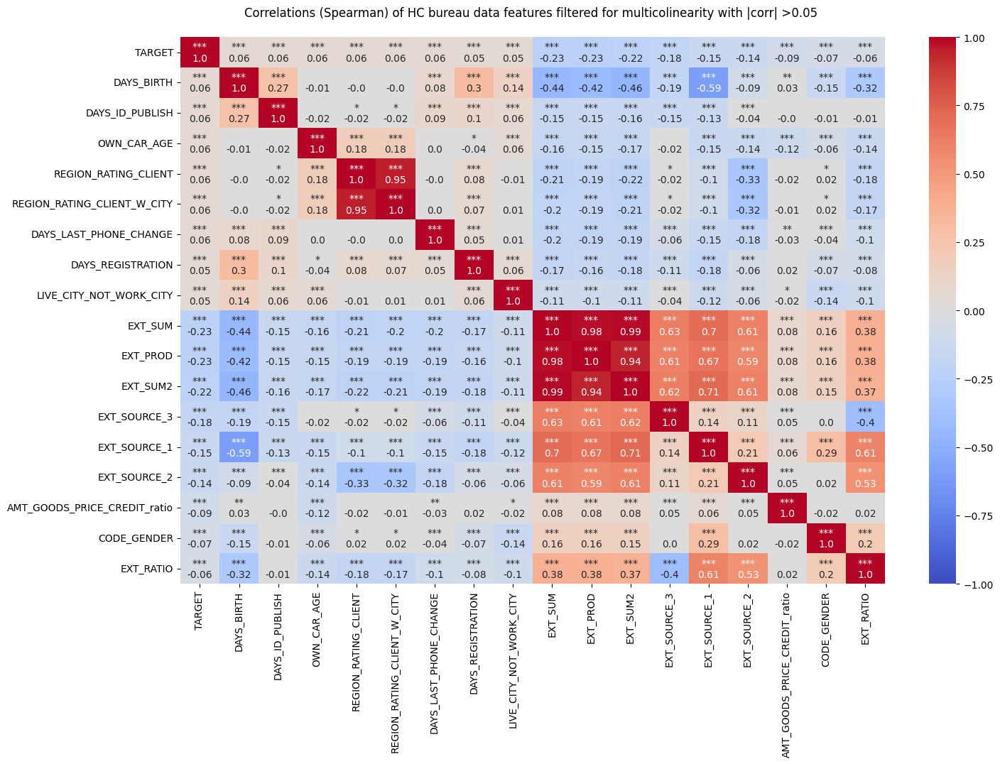

In [114]:
%reload_ext autoreload

dfunc.corr_plot_pval(df_target, multicol_reduced_feat, corr_method='spearman', abs_cut_off = 0.05,
                     title = '(Spearman) of HC bureau data features filtered for multicolinearity with |corr| >')

We can use the matrix to discard multicolinearity between the selected features:

* remove DAYS_CREDIT_ENDDATE and DAYS_ENDDATE_FACT and use updated columns DAYS_CREDIT_ENDDATE_mod and DAYS_ENDDATE_FACT_mod instead

* drop STATUS_C for ACTIVITY_Closed

* ACTIVITY_Closed vs ACTIVITY_Active

In [115]:
last_multicols = ['DAYS_CREDIT_ENDDATE', 'DAYS_ENDDATE_FACT']

In [116]:
final_multicol_reduced_feat = multicol_reduced_feat.copy()
for item in last_multicols:
    if item in final_multicol_reduced_feat:
        final_multicol_reduced_feat.remove(item)

#final_multicol_reduced_feat= ['int_rate','inq_last_12m','dti','loan_amnt','delinq_2yrs',
#                              'pub_rec_bankruptcies','fico_range_high',
#                              'annual_inc','mo_sin_old_il_acct']

print('We are left with', len(final_multicol_reduced_feat), 'numerical features.')

We are left with 18 numerical features.


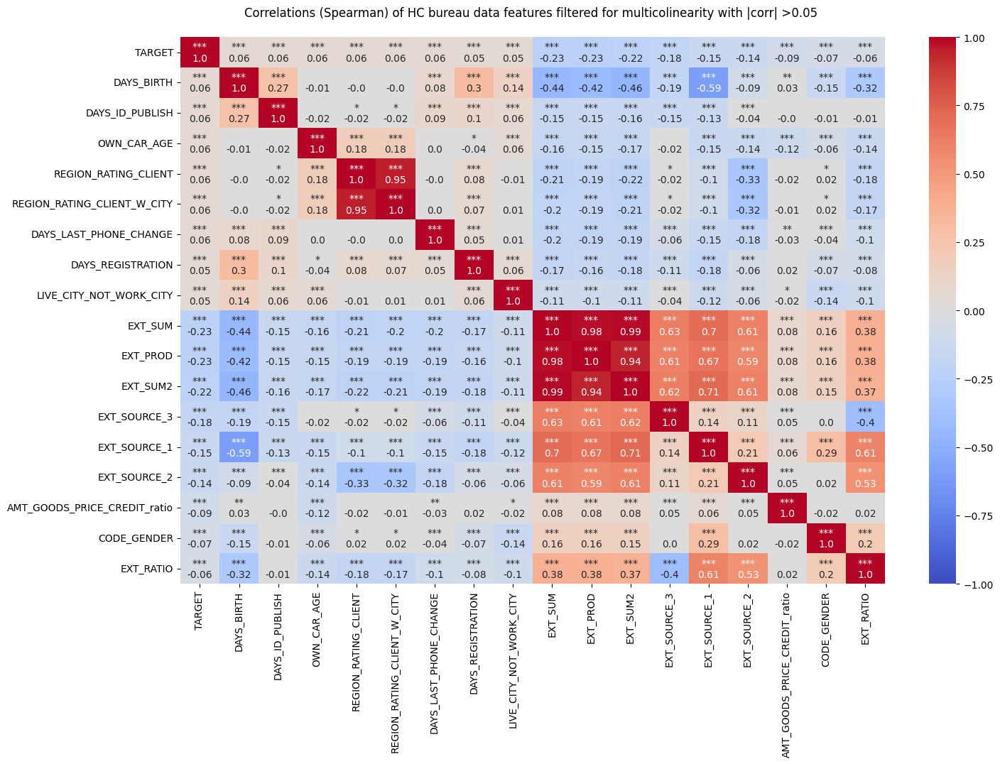

In [117]:
%reload_ext autoreload

dfunc.corr_plot_pval(df_target, final_multicol_reduced_feat, corr_method='spearman', abs_cut_off = 0.05,
                     title = '(Spearman) of HC bureau data features filtered for multicolinearity with |corr| >')

#### Target Scatter Matrix

In [118]:
#%time
%reload_ext autoreload

num_features = final_multicol_reduced_feat
#
#df = LCacc_PC_EDA
to_scatter = num_features #[:6]
#to_scatter.extend(['TARGET'])

dfunc.scattermatrix(
    df_target,
    [to_scatter],
    colors = ['TARGET'],
    titles= [""],
)

## Tests

Do the features have a significant influence on the response variable (insurance)?

#### Normality Check for Numeric Data

In [119]:
features = num_feat

shapiros = []
JB_tests =[]

for feature in features:
    shapiros.append(pg.normality(df_target[feature], method="shapiro"))
    JB_tests.append(pg.normality(df_target[feature], method="jarque_bera"))

shapiro = pd.concat(shapiros).reset_index()
JB_test = pd.concat(JB_tests).reset_index()

shapiro['signif'] = shapiro['pval'].apply(lambda x: "".join(["*" for t in [0.05, 0.01, 0.001] if x <= t]))
JB_test['signif'] = JB_test['pval'].apply(lambda x: "".join(["*" for t in [0.05, 0.01, 0.001] if x <= t]))

normality = shapiro
normality = normality.merge(JB_test, on='index', suffixes = ['_SH', '_JB'], )
normality.round(4).head()

,index,W_SH,pval_SH,normal_SH,signif_SH,W_JB,pval_JB,normal_JB,signif_JB
0,SK_ID_CURR,0.9561,0.0,False,***,588.9156,0.0,False,***
1,TARGET,0.3032,0.0,False,***,38407.6144,0.0,False,***
2,CODE_GENDER,0.6018,0.0,False,***,1737.4500,0.0,False,***
3,FLAG_OWN_CAR,0.6013,0.0,False,***,1739.7229,0.0,False,***
4,FLAG_OWN_REALTY,0.5819,0.0,False,***,1856.4199,0.0,False,***


In [120]:
normality.loc[(normality.normal_SH==True) | (normality.normal_JB==True)].head()

,index,W_SH,pval_SH,normal_SH,signif_SH,W_JB,pval_JB,normal_JB,signif_JB
16,FLAG_MOBIL,1.0,1.0,True,,NaN,NaN,False,
83,FLAG_DOCUMENT_2,1.0,1.0,True,,NaN,NaN,False,


### Difference in Feature Mean for Fully Paid and Charged Off: Independent 2-sample T-test

Hypothesis for a given feature: Mean(Fully Paid) = Mean(Charged Off)

Alternative: Mean(Fully Paid) != Mean(Charged Off)

Significance level: alpha = 0.05

Normality cannot be assumed for any of the numeric features.
But the sample size ist large enough for the central limit theorem to hold.

I conduct a two-sided t-test, but to be on the safe side I also conduct a non-parametric test, the Mann-Whitney-U-Test.

In [121]:
collect_res=[]

charged_off = df_target.loc[df_target.TARGET_mod == 'Payment Issues']
fully_paid = df_target.loc[df_target.TARGET_mod == 'No Payment Issues']

features = num_feat


from scipy.stats import mannwhitneyu


for feature in features:
    fully_paid_feat = fully_paid.loc[~fully_paid[feature].isna()][feature]
    charged_off_feat = charged_off.loc[~charged_off[feature].isna()][feature]
    res = pg.ttest(fully_paid_feat, charged_off_feat, paired=False)
    res['feature'] = feature
    res['MWU-p-val'] = mannwhitneyu(fully_paid_feat, charged_off_feat).pvalue
    collect_res.append(res)

all_res = pd.concat(collect_res)


In [122]:
all_res.reset_index(inplace=True, drop=True)
all_res[['feature', 'p-val', 'CI95%', 'MWU-p-val' ]].round(4).style.background_gradient(cmap="Blues")


,feature,p-val,CI95%,MWU-p-val
0,SK_ID_CURR,0.119000,[-1482.11 12990.77],0.122300
1,TARGET,0.000000,[nan nan],0.000000
2,CODE_GENDER,0.000000,[0.08 0.15],0.000000
3,FLAG_OWN_CAR,0.229900,[-0.01 0.05],0.235300
4,FLAG_OWN_REALTY,0.994600,[-0.03 0.03],0.994600
5,CNT_CHILDREN,0.092800,[-0.1 0.01],0.065800
6,AMT_INCOME_TOTAL,0.480300,[-4751.72 10091.9 ],0.327100
7,AMT_CREDIT,0.134100,[-6079.19 45467.42],0.991700
8,AMT_ANNUITY,0.364200,[-1333.64 490.05],0.025900
9,AMT_GOODS_PRICE,0.002700,[12284.81 58617.1 ],0.066700


In [123]:
p_cut_off = 0.05

loan_status_insignificant = all_res[['feature', 'p-val', 'MWU-p-val']
                ].loc[#(all_res['p-val']
                #> p_cut_off) |
                 (all_res['MWU-p-val']
                > p_cut_off)
                ].round(1)

len(loan_status_insignificant), loan_status_insignificant.feature.to_list()


(73,
 ['SK_ID_CURR',
  'FLAG_OWN_CAR',
  'FLAG_OWN_REALTY',
  'CNT_CHILDREN',
  'AMT_INCOME_TOTAL',
  'AMT_CREDIT',
  'AMT_GOODS_PRICE',
  'DAYS_EMPLOYED',
  'FLAG_MOBIL',
  'FLAG_CONT_MOBILE',
  'FLAG_EMAIL',
  'CNT_FAM_MEMBERS',
  'REG_REGION_NOT_LIVE_REGION',
  'REG_REGION_NOT_WORK_REGION',
  'LIVE_REGION_NOT_WORK_REGION',
  'REG_CITY_NOT_LIVE_CITY',
  'BASEMENTAREA_AVG',
  'YEARS_BEGINEXPLUATATION_AVG',
  'YEARS_BUILD_AVG',
  'COMMONAREA_AVG',
  'FLOORSMIN_AVG',
  'LANDAREA_AVG',
  'NONLIVINGAPARTMENTS_AVG',
  'NONLIVINGAREA_AVG',
  'BASEMENTAREA_MODE',
  'YEARS_BEGINEXPLUATATION_MODE',
  'YEARS_BUILD_MODE',
  'COMMONAREA_MODE',
  'ENTRANCES_MODE',
  'FLOORSMIN_MODE',
  'LANDAREA_MODE',
  'LIVINGAPARTMENTS_MODE',
  'NONLIVINGAPARTMENTS_MODE',
  'NONLIVINGAREA_MODE',
  'BASEMENTAREA_MEDI',
  'YEARS_BEGINEXPLUATATION_MEDI',
  'YEARS_BUILD_MEDI',
  'COMMONAREA_MEDI',
  'FLOORSMIN_MEDI',
  'LANDAREA_MEDI',
  'LIVINGAPARTMENTS_MEDI',
  'NONLIVINGAPARTMENTS_MEDI',
  'NONLIVINGAREA_MEDI',


With |t-statistics| > xxxx and
p-values < xxxx for a significance level alpha = 0.05, I can reject the null hypothesis (=no difference in means) for all numerical features, except from xxxxx.

Based on the estimated difference in sample means, I can support that there is a significant difference between the population means for xxx, xxx, xxx for paid and charged off loan.

This finding confirms our expectation from the correlation matrix.

### Other (Non-)Parametric Tests:

Hypothesis for a given feature:

The proportions/means for the targets's classes
do not differ, i.e. Mean(class x) = Mean(class y) for all x, y in classes of a feature

Alternative: The proportions/means for the targets's classes
are different.

Significance level: alpha = 0.05

In [124]:
targets = ['TARGET']

#### Chi-squared

In [139]:
%reload_ext autoreload

cat_feat_chi2 = cat_feat.copy()
cat_feat_chi2.remove('TARGET_mod')
features = cat_feat_chi2
collect_drops_chi2=[]
p_cut_off = 0.05

for target in targets:
    print('\nTesting the dependence of >'+target+
          '< on the categorical features\n')
    feature_chi2 = dfunc.dependency_test(df_target, features, target,
                                   type = 'chi2')
    print(feature_chi2.round(3))
    collect_drops_target = feature_chi2.loc[(feature_chi2[
                                                     'chi2_pvals']
                                                     > p_cut_off)
                                                     ].index.to_list()
    collect_drops_chi2.append(collect_drops_target)


Testing the dependence of >TARGET< on the categorical features

                            chi2_scores  chi2_pvals
NAME_CONTRACT_TYPE                8.364       0.004
NAME_TYPE_SUITE                   0.303       0.582
NAME_INCOME_TYPE                  3.461       0.063
NAME_EDUCATION_TYPE               3.101       0.078
NAME_FAMILY_STATUS                0.069       0.792
NAME_HOUSING_TYPE                 0.926       0.336
OCCUPATION_TYPE                  14.670       0.000
WEEKDAY_APPR_PROCESS_START        0.341       0.560
FONDKAPREMONT_MODE                0.306       0.580
HOUSETYPE_MODE                    0.055       0.814
WALLSMATERIAL_MODE                1.408       0.235
EMERGENCYSTATE_MODE               0.167       0.683
ORGANIZATION_TYPE_red             3.678       0.055


In [140]:
collect_drops_chi2

[['NAME_TYPE_SUITE',
  'NAME_INCOME_TYPE',
  'NAME_EDUCATION_TYPE',
  'NAME_FAMILY_STATUS',
  'NAME_HOUSING_TYPE',
  'WEEKDAY_APPR_PROCESS_START',
  'FONDKAPREMONT_MODE',
  'HOUSETYPE_MODE',
  'WALLSMATERIAL_MODE',
  'EMERGENCYSTATE_MODE',
  'ORGANIZATION_TYPE_red']]

#### ANOVA

In [141]:
features = num_feat + cat_feat_chi2
collect_drops_f_classif=[]
p_cut_off = 0.05

for target in targets:
    print('\nTesting the dependence of >'+target+
          '< on the numerical features\n')
    feature_f_classif = dfunc.dependency_test(df_target, features, target,
                                            type = 'f_classif')
    print(feature_f_classif.round(3))
    collect_drops_target = feature_f_classif.loc[(feature_f_classif[
                                                     'f_classif_pvals']
                                                     > p_cut_off)
                                                     ].index.to_list()
    collect_drops_f_classif.append(collect_drops_target)


Testing the dependence of >TARGET< on the numerical features

                              f_classif_scores  f_classif_pvals
SK_ID_CURR                               0.579            0.448
CODE_GENDER                              0.301            0.584
FLAG_OWN_CAR                               NaN              NaN
FLAG_OWN_REALTY                          5.284            0.023
CNT_CHILDREN                             0.567            0.453
AMT_INCOME_TOTAL                         2.413            0.123
AMT_CREDIT                               0.444            0.506
AMT_ANNUITY                              0.030            0.862
AMT_GOODS_PRICE                          0.902            0.344
REGION_POPULATION_RELATIVE               1.571            0.212
DAYS_BIRTH                               0.351            0.555
DAYS_EMPLOYED                            0.492            0.484
DAYS_REGISTRATION                        0.627            0.430
DAYS_ID_PUBLISH                          

In [142]:
collect_drops_f_classif

[['SK_ID_CURR',
  'CODE_GENDER',
  'CNT_CHILDREN',
  'AMT_INCOME_TOTAL',
  'AMT_CREDIT',
  'AMT_ANNUITY',
  'AMT_GOODS_PRICE',
  'REGION_POPULATION_RELATIVE',
  'DAYS_BIRTH',
  'DAYS_EMPLOYED',
  'DAYS_REGISTRATION',
  'DAYS_ID_PUBLISH',
  'OWN_CAR_AGE',
  'FLAG_WORK_PHONE',
  'FLAG_PHONE',
  'FLAG_EMAIL',
  'CNT_FAM_MEMBERS',
  'REGION_RATING_CLIENT',
  'REGION_RATING_CLIENT_W_CITY',
  'HOUR_APPR_PROCESS_START',
  'REG_REGION_NOT_WORK_REGION',
  'LIVE_REGION_NOT_WORK_REGION',
  'LIVE_CITY_NOT_WORK_CITY',
  'EXT_SOURCE_1',
  'EXT_SOURCE_2',
  'APARTMENTS_AVG',
  'YEARS_BEGINEXPLUATATION_AVG',
  'YEARS_BUILD_AVG',
  'COMMONAREA_AVG',
  'ELEVATORS_AVG',
  'ENTRANCES_AVG',
  'FLOORSMAX_AVG',
  'FLOORSMIN_AVG',
  'LANDAREA_AVG',
  'LIVINGAREA_AVG',
  'NONLIVINGAPARTMENTS_AVG',
  'NONLIVINGAREA_AVG',
  'APARTMENTS_MODE',
  'YEARS_BEGINEXPLUATATION_MODE',
  'YEARS_BUILD_MODE',
  'COMMONAREA_MODE',
  'ELEVATORS_MODE',
  'ENTRANCES_MODE',
  'FLOORSMAX_MODE',
  'FLOORSMIN_MODE',
  'LANDAREA_MOD

#### Regression

In [143]:
%reload_ext autoreload

features = num_feat + cat_feat_chi2
collect_drops_f_regress=[]
p_cut_off = 0.05

for target in targets:
    print('\nTesting the dependence of >'+target+
          '< on the numerical features\n')
    feature_f_regress_num = dfunc.dependency_test(df_target, features, target,
                                            type = 'f_regress')
    print(feature_f_regress_num.round(3))
    collect_drops_target = feature_f_regress_num.loc[(feature_f_regress_num[
                                                     'f_regress_pvals']
                                                     > p_cut_off)
                                                     ].index.to_list()
    collect_drops_f_regress.append(collect_drops_target)


Testing the dependence of >TARGET< on the numerical features

                              f_regress_scores  f_regress_pvals
SK_ID_CURR                               0.579            0.448
CODE_GENDER                              0.301            0.584
FLAG_OWN_CAR                             0.000            1.000
FLAG_OWN_REALTY                          5.284            0.023
CNT_CHILDREN                             0.567            0.453
AMT_INCOME_TOTAL                         2.413            0.123
AMT_CREDIT                               0.444            0.506
AMT_ANNUITY                              0.030            0.862
AMT_GOODS_PRICE                          0.902            0.344
REGION_POPULATION_RELATIVE               1.571            0.212
DAYS_BIRTH                               0.351            0.555
DAYS_EMPLOYED                            0.492            0.484
DAYS_REGISTRATION                        0.627            0.430
DAYS_ID_PUBLISH                          

In [144]:
collect_drops_f_regress

[['SK_ID_CURR',
  'CODE_GENDER',
  'FLAG_OWN_CAR',
  'CNT_CHILDREN',
  'AMT_INCOME_TOTAL',
  'AMT_CREDIT',
  'AMT_ANNUITY',
  'AMT_GOODS_PRICE',
  'REGION_POPULATION_RELATIVE',
  'DAYS_BIRTH',
  'DAYS_EMPLOYED',
  'DAYS_REGISTRATION',
  'DAYS_ID_PUBLISH',
  'OWN_CAR_AGE',
  'FLAG_MOBIL',
  'FLAG_EMP_PHONE',
  'FLAG_WORK_PHONE',
  'FLAG_CONT_MOBILE',
  'FLAG_PHONE',
  'FLAG_EMAIL',
  'CNT_FAM_MEMBERS',
  'REGION_RATING_CLIENT',
  'REGION_RATING_CLIENT_W_CITY',
  'HOUR_APPR_PROCESS_START',
  'REG_REGION_NOT_LIVE_REGION',
  'REG_REGION_NOT_WORK_REGION',
  'LIVE_REGION_NOT_WORK_REGION',
  'LIVE_CITY_NOT_WORK_CITY',
  'EXT_SOURCE_1',
  'EXT_SOURCE_2',
  'APARTMENTS_AVG',
  'YEARS_BEGINEXPLUATATION_AVG',
  'YEARS_BUILD_AVG',
  'COMMONAREA_AVG',
  'ELEVATORS_AVG',
  'ENTRANCES_AVG',
  'FLOORSMAX_AVG',
  'FLOORSMIN_AVG',
  'LANDAREA_AVG',
  'LIVINGAREA_AVG',
  'NONLIVINGAPARTMENTS_AVG',
  'NONLIVINGAREA_AVG',
  'APARTMENTS_MODE',
  'YEARS_BEGINEXPLUATATION_MODE',
  'YEARS_BUILD_MODE',
  'COMMO

#### Mutual Information

In [145]:
%reload_ext autoreload

features = num_feat + cat_feat_chi2
collect_drops_mutual_info_classif=[]
p_cut_off = 0.05

for target in targets:
    print('\nTesting the dependence of >'+target+
          '< on the numerical features\n')
    feature_mic_num = dfunc.dependency_test(df_target, features, target,
                                            type = 'mutual_info_classif')
    print(feature_mic_num.round(3))
    collect_drops_target = feature_mic_num.loc[(feature_mic_num[
                                                     'mutual_info_classif_scores']
                                                     < 0.01)
                                                     ].index.to_list()
    collect_drops_mutual_info_classif.append(collect_drops_target)


Testing the dependence of >TARGET< on the numerical features

                              mutual_info_classif_scores
SK_ID_CURR                                         0.006
CODE_GENDER                                        0.000
FLAG_OWN_CAR                                       0.000
FLAG_OWN_REALTY                                    0.012
CNT_CHILDREN                                       0.033
AMT_INCOME_TOTAL                                   0.036
AMT_CREDIT                                         0.000
AMT_ANNUITY                                        0.000
AMT_GOODS_PRICE                                    0.011
REGION_POPULATION_RELATIVE                         0.064
DAYS_BIRTH                                         0.007
DAYS_EMPLOYED                                      0.000
DAYS_REGISTRATION                                  0.000
DAYS_ID_PUBLISH                                    0.000
OWN_CAR_AGE                                        0.004
FLAG_MOBIL               

In [146]:
collect_drops_mutual_info_classif

[['SK_ID_CURR',
  'CODE_GENDER',
  'FLAG_OWN_CAR',
  'AMT_CREDIT',
  'AMT_ANNUITY',
  'DAYS_BIRTH',
  'DAYS_EMPLOYED',
  'DAYS_REGISTRATION',
  'DAYS_ID_PUBLISH',
  'OWN_CAR_AGE',
  'FLAG_MOBIL',
  'FLAG_EMP_PHONE',
  'FLAG_WORK_PHONE',
  'FLAG_CONT_MOBILE',
  'FLAG_PHONE',
  'FLAG_EMAIL',
  'CNT_FAM_MEMBERS',
  'HOUR_APPR_PROCESS_START',
  'REG_REGION_NOT_LIVE_REGION',
  'LIVE_REGION_NOT_WORK_REGION',
  'REG_CITY_NOT_LIVE_CITY',
  'LIVE_CITY_NOT_WORK_CITY',
  'EXT_SOURCE_2',
  'APARTMENTS_AVG',
  'BASEMENTAREA_AVG',
  'COMMONAREA_AVG',
  'ELEVATORS_AVG',
  'ENTRANCES_AVG',
  'FLOORSMAX_AVG',
  'FLOORSMIN_AVG',
  'LANDAREA_AVG',
  'LIVINGAPARTMENTS_AVG',
  'LIVINGAREA_AVG',
  'NONLIVINGAPARTMENTS_AVG',
  'NONLIVINGAREA_AVG',
  'APARTMENTS_MODE',
  'BASEMENTAREA_MODE',
  'COMMONAREA_MODE',
  'ELEVATORS_MODE',
  'ENTRANCES_MODE',
  'FLOORSMAX_MODE',
  'LANDAREA_MODE',
  'LIVINGAPARTMENTS_MODE',
  'LIVINGAREA_MODE',
  'NONLIVINGAPARTMENTS_MODE',
  'NONLIVINGAREA_MODE',
  'APARTMENTS_MEDI'

Based on the samples and the p-values for a significance level alpha = 0.05, I have enough evidence to reject the null hypothesis for the features XXXXX

I conclude that there is a significant difference between the response variables' proportion of each of the classes for a given feature.

We fail to reject the null hypothesis for the features xxxxxx.

This finding confirms our expectation from the correlation matrix that the xxxx are not correlated with the response variables.


#### Common Drops

In [147]:
MI_drop = collect_drops_mutual_info_classif[0]
f_clas_drop = collect_drops_f_classif[0]
chi2_drop = collect_drops_chi2[0]
MWU_drop = loan_status_insignificant.feature.to_list()

collected_drops = MI_drop + f_clas_drop + chi2_drop + MWU_drop
collected_drop_lists = [MI_drop, f_clas_drop, chi2_drop, MWU_drop]

# set of all drops found by tests
all_unique_drops = list(set(collected_drops))
all_unique_drops.sort()


# drops common in all tests (except chi2)
common_drops = set(MI_drop) & set(f_clas_drop) & set(MWU_drop)
common_drops = list(common_drops)
common_drops.sort()

# any common drops in hihgest TARGET-correlated features?
corr_overlap = set(final_multicol_reduced_feat) & set(common_drops)


corr_overlap, common_drops

(set(),
 ['AMT_CREDIT',
  'AMT_REQ_CREDIT_BUREAU_HOUR',
  'AMT_REQ_CREDIT_BUREAU_MON',
  'AMT_REQ_CREDIT_BUREAU_WEEK',
  'CNT_FAM_MEMBERS',
  'COMMONAREA_AVG',
  'COMMONAREA_MEDI',
  'COMMONAREA_MODE',
  'CURRENCY_1',
  'DAYS_EMPLOYED',
  'DEF_60_CNT_SOCIAL_CIRCLE',
  'ENTRANCES_MODE',
  'FLAG_DOCUMENT_5',
  'FLAG_DOCUMENT_8',
  'FLAG_DOCUMENT_9',
  'FLAG_DOCUMENT_SUM',
  'FLAG_EMAIL',
  'FLOORSMIN_AVG',
  'LANDAREA_AVG',
  'LANDAREA_MEDI',
  'LANDAREA_MODE',
  'LIVE_REGION_NOT_WORK_REGION',
  'NONLIVINGAPARTMENTS_AVG',
  'NONLIVINGAPARTMENTS_MEDI',
  'NONLIVINGAPARTMENTS_MODE',
  'NONLIVINGAREA_AVG',
  'NONLIVINGAREA_MEDI',
  'NONLIVINGAREA_MODE',
  'SK_ID_CURR',
  'dti_prev'])